In [1]:
import pandas as pd
import numpy as np
import os
import pickle
import sklearn
from sklearn.base import BaseEstimator

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score, roc_auc_score, roc_curve

import xgboost
import lightgbm

import shap
import lime
import lime.lime_tabular
from lime import submodular_pick

import operator

import matplotlib.pyplot as plt

from src.models.mlp_preprocessor import MLPPreprocessor
from src.models.linear_preprocessor import LinearPreprocessor

In [2]:
class ShapObject:
    
    def __init__(self, base_values, data, values, feature_names):
        self.base_values = base_values # Single value
        self.data = data # Raw feature values for 1 row of data
        self.values = values # SHAP values for the same row of data
        self.feature_names = feature_names # Column names
        
class Preprocessor(BaseEstimator):
    
    def transform(self, df: pd.DataFrame, col_names: list = None) -> pd.DataFrame:
        if not isinstance(df, pd.DataFrame):
            df = pd.DataFrame(df, columns=col_names)

        cols_to_diff = [
        ['PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6'],
        ['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3',
         'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6']
        ]
        res_list = []

        for cols in cols_to_diff:
            diff_df = df[cols].diff(axis=1).iloc[:, 1:]
            diff_df.columns = [f'{col}_DIFF' for col in diff_df.columns]
            res_list.append(diff_df)

        df = pd.concat(
            [df, *res_list],
            axis=1
        )

        return df
    
    def fit_transform(self, df: pd.DataFrame) -> pd.DataFrame:
        return self.transform(df)

In [3]:
DATA_PATH = os.path.join("data", "credit_card_default_analysis.csv")
TEST_DATA_PATH = os.path.join("data", "test_dataset.csv")
TRAIN_DATA_PATH = os.path.join("data", "train_dataset.csv")

LGBM_PATH = os.path.join("src", "models", "trained", "lgbm_clf.pkl")
LOGREG_PATH = os.path.join("src", "models", "trained", "log_reg_v1.pkl")
MLP_PATH = os.path.join("src", "models", "trained", "mlp.pkl")

n_explanations = 6
N_EXPLANATIONS = 6

CATEGORICAL_FEATURE = ['EDUCATION', 'SEX', 'MARRIAGE']
CLASS_NAMES = ['NO', 'YES']
RND_SEED = 1

In [4]:
np.random.seed(RND_SEED)

In [5]:
# dataset = pd.read_csv(DATA_PATH, index_col='ID')
# # df.drop(columns='default', inplace=True)
# feature_names = list(dataset.columns)
# categorical_features_indices = [feature_names.index(feature_name) for feature_name in CATEGORICAL_FEATURE]
# dataset.head()

In [6]:
# train_X, test_X, train_Y, test_Y = train_test_split(dataset.drop(["default"], axis=1), dataset.default, random_state=RND_SEED)
# print(f"train_X.shape = {train_X.shape}")
# print(f"train_Y.shape = {train_Y.shape}")
# print(f"test_X.shape = {test_X.shape}")
# print(f"test_Y.shape = {test_Y.shape}")

In [7]:
# test_df = test_X.copy()
# test_df['default'] = test_Y
# test_df.to_csv(TEST_DATA_PATH)

# train_df = train_X.copy()
# train_df['default'] = train_Y
# train_df.to_csv(TRAIN_DATA_PATH)

In [8]:
test_df = pd.read_csv(TEST_DATA_PATH, index_col='ID')
test_df

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
ID,,,,,,,,,,,,,,,,,,,,,
10748,310000,1,3,1,32,0,0,0,0,0,...,84373,57779,14163,8295,6000,4000,3000,1000,2000,0
12574,10000,2,3,1,49,0,0,0,0,2,...,1690,1138,930,0,0,2828,0,182,0,1
29677,50000,1,2,1,28,0,0,0,0,0,...,45975,1300,43987,0,46257,2200,1300,43987,1386,0
8857,80000,2,3,1,52,2,2,3,3,3,...,40748,39816,40607,3700,1600,1600,0,1600,1600,1
21099,270000,1,1,2,34,1,2,0,0,2,...,22448,15490,17343,0,4000,2000,0,2000,2000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29318,30000,1,3,2,26,0,0,0,0,0,...,18972,28051,20782,2000,2000,1600,10000,2140,0,0
18630,50000,2,1,2,26,0,0,0,0,0,...,20090,20334,20856,1600,1700,1800,875,1000,4700,0
15330,390000,2,1,2,33,0,0,0,0,0,...,0,1560,4386,1017,0,0,1560,4386,12000,0


In [9]:
with open(LGBM_PATH, 'rb') as file:
    lgbm_model = pickle.load(file)
    
with open(LOGREG_PATH, 'rb') as file:
    logreg_model = pickle.load(file)
    
logreg_preprocessor = logreg_model.preprocess
logreg_model = logreg_model.log_reg

    
# with open(MLP_PATH, 'rb') as file:
#     mlp_model = pickle.load(file)

In [10]:
preprocessor = Preprocessor()
lgbm_test_data = preprocessor.transform(test_df.drop(['default'], axis=1))
lgbm_feature_name = lgbm_test_data.columns
lgbm_categorical_names = CATEGORICAL_FEATURE
lgbm_categorical_features_indices = [i for i in range(len(lgbm_feature_name)) if lgbm_feature_name[i] in lgbm_categorical_names]

logreg_test_data = test_df.drop(['default'], axis=1)
logreg_test_data = logreg_preprocessor(logreg_test_data)
logreg_feature_name = logreg_test_data.columns
logreg_categorical_names = CATEGORICAL_FEATURE
logreg_categorical_features_indices = [i for i in range(len(logreg_feature_name)) if logreg_feature_name[i] in logreg_categorical_names]

# mlp_test_data = test_df.drop(['default'], axis=1)
# mlp_feature_name = logreg_test_data.columns
# mlp_categorical_names = CATEGORICAL_FEATURE
# mlp_categorical_features_indices = [i for i in range(len(mlp_feature_name)) if mlp_feature_name[i] in mlp_categorical_names]

labels = test_df.default.to_numpy()

In [11]:
lgbm_predicted_proba = lgbm_model.predict_proba(lgbm_test_data)
logreg_predicted_proba = logreg_model.predict_proba(logreg_test_data)
# mlp_predicted_proba = mlp_model.predict_proba(test_data)

In [12]:
lgbm_labels = lgbm_predicted_proba.argmax(axis=1)
logreg_labels = logreg_predicted_proba.argmax(axis=1)
# mlp_labels = mlp_predicted_proba.argmax(axis=1)

## 3. Применение SHAP

### 3.1. Сравнить важность признаков, получаемую с помощью SHAP с важностью признаков, получаемую с помощью модели на основе ансамбля деревьев решений. Прокомментировать результат (Есть ли разница? Можете ли вы это объяснить?). 


 98%|===================| 7366/7500 [00:12<00:00]        

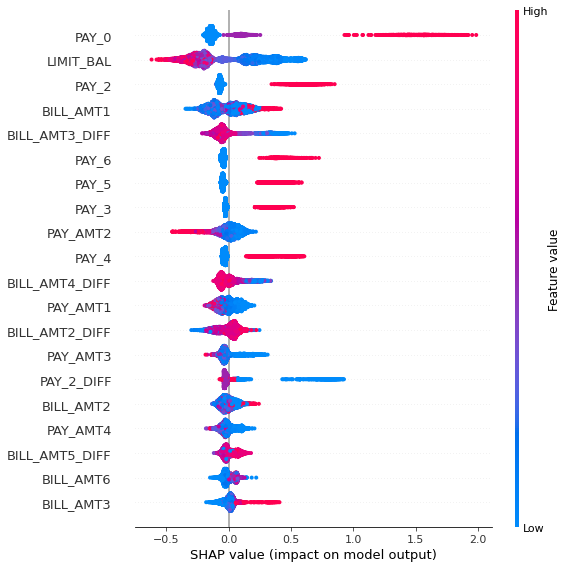

In [13]:
test_data_for_shap = lgbm_test_data.to_numpy()

explainer = shap.TreeExplainer(lgbm_model, test_data_for_shap, feature_names=lgbm_feature_name)
shap_values = explainer.shap_values(test_data_for_shap)
shap.summary_plot(shap_values, test_data_for_shap, lgbm_feature_name)

 95%|=================== | 7150/7500 [00:11<00:00]       

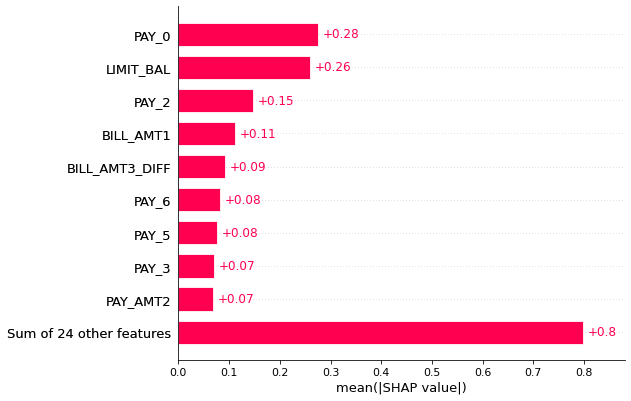

In [14]:
explainer = shap.TreeExplainer(lgbm_model, test_data_for_shap, feature_names=lgbm_feature_name)
shap_values = explainer(test_data_for_shap)
shap.plots.bar(shap_values)

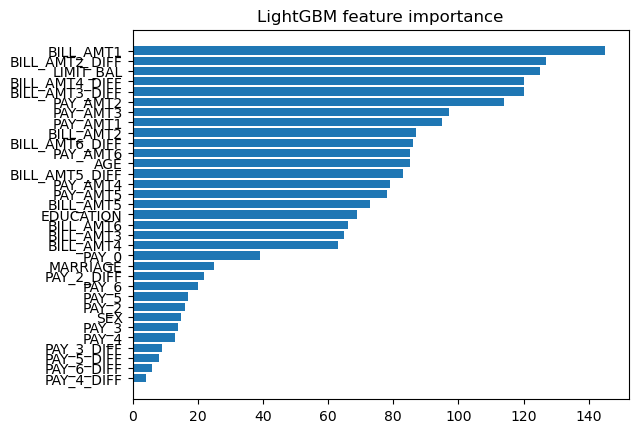

In [15]:
feature_imp = {n:v for n,v in zip(lgbm_feature_name, lgbm_model.feature_importances_.T)}
sorted_feature_imp = sorted(feature_imp.items(), key=operator.itemgetter(1))

plt.rcdefaults()
fig, ax = plt.subplots()

ax.barh(range(len(sorted_feature_imp)), [v[1] for v in sorted_feature_imp], align='center')
ax.set_yticks(range(len(sorted_feature_imp)))
ax.set_yticklabels([v[0] for v in sorted_feature_imp])
# ax.invert_yaxis()
ax.set_title('LightGBM feature importance')
plt.show()

Из примеров выше можно видеть, что shap выделил как наиболее важные признаки: 

- PAY_0 - платеж в сентябре
- LIMIT_BAL - размер кредитного лимита
- PAY_2 - платеж в октябре
- BILL_AMT1 - задолженность на сентябрь

При этом, LightGBM выделил как наиболее важные следующие признаки: 
- BILL_AMT1 - задолженность на сентябрь
- BILL_AMT2_DIFF - признак, полученный как разница между BILL_AMT1 и BILL_AMT2, где BILL_AMT1 и BILL_AMT2 - задолженность за сентябрь и август соответственно
- LIMIT_BAL - размер кредитного лимита
- BILL_AMT4_DIFF - признак, полученный как разница между BILL_AMT3 и BILL_AMT4, где BILL_AMT3 и BILL_AMT4 - задолженность за июль и июнь соответственно

Видно, что эти множества пересекаются. Также из примера выше видно, что высокие значения PAY_0, PAY_2, PAY_3 и т.д. вносят большой положительный вклад в решение модели, а высокое значение размера кредитного лимита LIMIT_BAL вносит отрицательный вклад.

### 3.2. Среди 3 методов, выбрать один, который обеспечивает наилучшее качества решения. Проанализировать SHAP-values для всего набора данных в целом. Меняется ли существенно важность признаков внутри класса и между классами? Какие признаки наиболее важны?

Найдем модель с наибольшим значением F1 score

In [16]:
lgbm_f1_score = f1_score(labels, lgbm_labels)
logreg_f1_score = f1_score(labels, logreg_labels)
# mlp_f1_score = f1_score(labels, mlp_labels)

print(f"LightGBM f1 score: {lgbm_f1_score}")
print(f"LogReg f1 score: {logreg_f1_score}")
# print(f"MLP f1 score: {mlp_f1_score}")

LightGBM f1 score: 0.5850000000000001
LogReg f1 score: 0.5294284901905033


Наилучший результат показала модель LightGBM

In [17]:
model_with_best_score = lgbm_model
test_data_for_shap = lgbm_test_data.to_numpy()
feature_names = lgbm_feature_name

In [18]:
shap.initjs()
explainer = shap.Explainer(model_with_best_score, test_data_for_shap, feature_names=feature_names)
exp_array =  shap.sample(test_data_for_shap, 100)
shap_values = explainer.shap_values(exp_array)
shap.force_plot(explainer.expected_value, shap_values, exp_array, feature_names=feature_names)

 94%|=================== | 7072/7500 [00:11<00:00]       

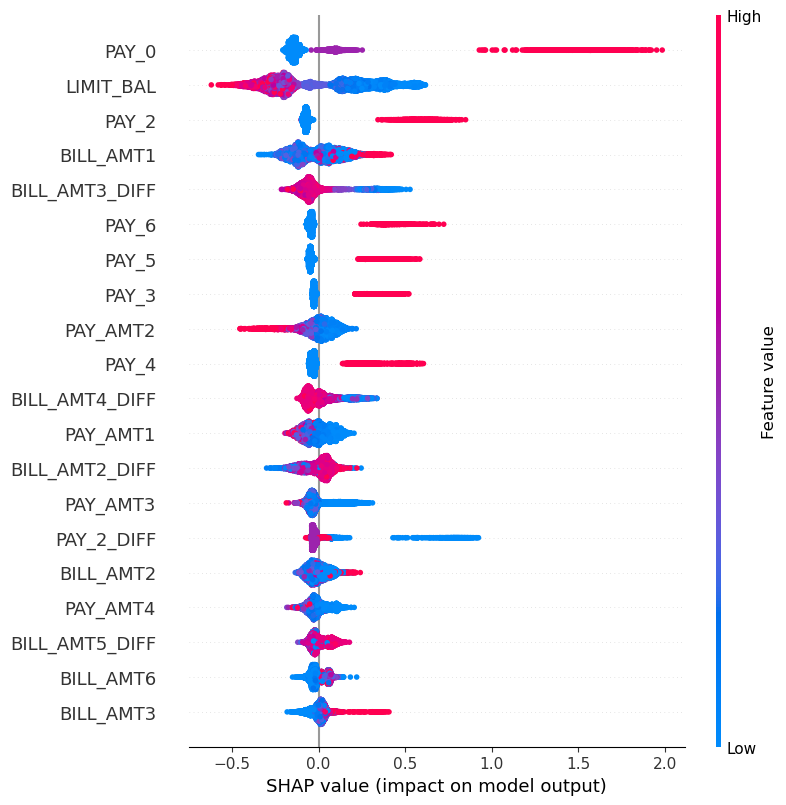

In [19]:
explainer = shap.Explainer(model_with_best_score, test_data_for_shap, feature_names=feature_names)
shap_values = explainer.shap_values(test_data_for_shap)
shap.summary_plot(shap_values, test_data_for_shap, feature_names)

Как видно из графиков выше, наиболее важными признаками оказались:

- PAY_0 - платеж в сентябре
- LIMIT_BAL - размер кредитного лимита
- PAY_2 - платеж в октябре
- BILL_AMT1 - задолженность на сентябрь

### 3.3. Для того же метода, что и в вопросе выше, выбрать 2 примера из разных классов, где модель дает правильный ответ, и 2 примера из разных классов, где модель ошибается. Проанализировать эти примеры для всех 3 моделей с помощью SHAP. Похожи ли объяснения?

In [20]:
true_0_id = [i for i in range(len(labels)) if (lgbm_labels[i] == 0 and
    logreg_labels[i] == 0 and
    labels[i] == 0)][0]
false_0_id = [i for i in range(len(labels)) if (lgbm_labels[i] == 0 and
    logreg_labels[i] == 0 and
    labels[i] != 0)][0]
true_1_id = [i for i in range(len(labels)) if (lgbm_labels[i] == 1 and
    logreg_labels[i] == 1 and
    labels[i] == 1)][0]
false_1_id = [i for i in range(len(labels)) if (lgbm_labels[i] == 1 and
    logreg_labels[i] == 1 and
    labels[i] != 1)][0]

lgbm_true_0 = lgbm_test_data.to_numpy()[true_0_id]
lgbm_true_1 = lgbm_test_data.to_numpy()[true_1_id]
lgbm_false_0 = lgbm_test_data.to_numpy()[false_0_id]
lgbm_false_1 = lgbm_test_data.to_numpy()[false_1_id]

logreg_true_0 = logreg_test_data.to_numpy()[true_0_id]
logreg_true_1 = logreg_test_data.to_numpy()[true_1_id]
logreg_false_0 = logreg_test_data.to_numpy()[false_0_id]
logreg_false_1 = logreg_test_data.to_numpy()[false_1_id]

print(f"True 0 id: {true_0_id}\n\tLogReg proba of 0: {logreg_predicted_proba[true_0_id][0]}\n\tLightGBM proba of 0: {lgbm_predicted_proba[true_0_id][0]}")
print(f"False 0 id: {false_0_id}\n\tLogReg proba of 0: {logreg_predicted_proba[false_0_id][0]}\n\tLightGBM proba of 0: {lgbm_predicted_proba[false_0_id][0]}")
print(f"True 1 id: {true_1_id}\n\tLogReg proba of 1: {logreg_predicted_proba[true_1_id][1]}\n\tLightGBM proba of 1: {lgbm_predicted_proba[true_1_id][1]}")
print(f"False 1 id: {false_1_id}\n\tLogReg proba of 1: {logreg_predicted_proba[false_1_id][1]}\n\tLightGBM proba of 1: {lgbm_predicted_proba[false_1_id][1]}")

True 0 id: 0
	LogReg proba of 0: 0.6649957578809766
	LightGBM proba of 0: 0.7740072795794104
False 0 id: 33
	LogReg proba of 0: 0.6493132892165235
	LightGBM proba of 0: 0.6363235510453268
True 1 id: 1
	LogReg proba of 1: 0.5280881897891854
	LightGBM proba of 1: 0.7016563263347448
False 1 id: 4
	LogReg proba of 1: 0.6715565477308683
	LightGBM proba of 1: 0.6435205670845531


Пример True 0 для LightGBM

In [21]:
shap.initjs()
explainer = shap.TreeExplainer(lgbm_model, lgbm_test_data, feature_names=lgbm_feature_name)
shap_values = explainer.shap_values(lgbm_test_data)
shap.force_plot(explainer.expected_value, shap_values[true_0_id, :], lgbm_true_0, feature_names=lgbm_feature_name)

100%|===================| 7474/7500 [00:12<00:00]        

Пример True 0 для LogReg

In [22]:
shap.initjs()
explainer = shap.LinearExplainer(logreg_model, logreg_test_data, feature_names=logreg_feature_name)
shap_values = explainer.shap_values(logreg_test_data)
shap.force_plot(explainer.expected_value, shap_values[true_0_id, :], logreg_true_0, feature_names=logreg_feature_name)

Для примеров выше видно, что объяснения не похожи: в случае LightGBM наибольший вклад вносят признаки PAY_2, LIMIT_BAL, SEX и MARRIGE. А в случае LogReg наибольший вклад вносят: BILL_AMT3_DIFF, BILL_AMT4_DIFF, LIMIT_BALL и BILL_AMT2_DIFF.

Пример False 0 для LightGBM

In [23]:
shap.initjs()
explainer = shap.TreeExplainer(lgbm_model, lgbm_test_data, feature_names=lgbm_feature_name)
shap_values = explainer.shap_values(lgbm_test_data)
shap.force_plot(explainer.expected_value, shap_values[false_0_id, :], lgbm_false_0, feature_names=lgbm_feature_name)

 97%|=================== | 7238/7500 [00:11<00:00]       

Пример False 0 для LogReg

In [24]:
shap.initjs()
explainer = shap.LinearExplainer(logreg_model, logreg_test_data, feature_names=logreg_feature_name)
shap_values = explainer.shap_values(logreg_test_data)
shap.force_plot(explainer.expected_value, shap_values[false_0_id, :], logreg_false_0, feature_names=logreg_feature_name)

Для примеров выше видно, что объяснения не похожи: в случае LightGBM наибольший вклад вносят признаки PAY_0 и BILL_AMT3. А в случае LogReg наибольший вклад вносят: PAY_0 и SEX.

Пример True 1 для LightGBM

In [25]:
shap.initjs()
explainer = shap.TreeExplainer(lgbm_model, lgbm_test_data, feature_names=lgbm_feature_name)
shap_values = explainer.shap_values(lgbm_test_data)
shap.force_plot(explainer.expected_value, shap_values[true_1_id, :], lgbm_true_1, feature_names=lgbm_feature_name)

 92%|==================  | 6887/7500 [00:11<00:00]       

Пример True 1 для LogReg

In [26]:
shap.initjs()
explainer = shap.LinearExplainer(logreg_model, logreg_test_data, feature_names=logreg_feature_name)
shap_values = explainer.shap_values(logreg_test_data)
shap.force_plot(explainer.expected_value, shap_values[true_1_id, :], logreg_true_1, feature_names=logreg_feature_name)

Для примеров выше видно, что объяснения чуть более похожи: в случае LightGBM наибольший вклад вносят признаки PAY_0, PAY_5, PAY_6 и LIMIT_BAL. А в случае LogReg наибольший вклад вносят: PAY_0, PAY_5_DIFF и LIMIT_BAL.

Пример False 1 для LightGBM

In [27]:
shap.initjs()
explainer = shap.TreeExplainer(lgbm_model, lgbm_test_data, feature_names=lgbm_feature_name)
shap_values = explainer.shap_values(lgbm_test_data)
shap.force_plot(explainer.expected_value, shap_values[false_1_id, :], lgbm_false_1, feature_names=lgbm_feature_name)

 96%|=================== | 7211/7500 [00:11<00:00]       

Пример False 1 для LogReg

In [28]:
shap.initjs()
explainer = shap.LinearExplainer(logreg_model, logreg_test_data, feature_names=logreg_feature_name)
shap_values = explainer.shap_values(logreg_test_data)
shap.force_plot(explainer.expected_value, shap_values[false_1_id, :], logreg_false_1, feature_names=logreg_feature_name)

Для примеров выше видно, что объяснения не похожи: в случае LightGBM наибольший вклад вносят признаки PAY_2, PAY_5, PAY_0 и LIMIT_BAL. А в случае LogReg наибольший вклад вносят: PAY_0, PAY_2_DIFF, PAY_3_DIFF и PAY_5_DIFF.

## Lime

### 4.1. Применить LIME к тем же моделям и тем же примерам, что и в предыдущем задании ( 4 картинки * 3 модели = 12 примеров). Получили ли вы похожее объяснения, что и в предыдущем примере? Если нет, можете ли вы это объяснить.

In [29]:
lgbm_explainer = lime.lime_tabular.LimeTabularExplainer(
    lgbm_test_data.to_numpy(), 
    feature_names = lgbm_feature_name, 
    class_names = CLASS_NAMES,                                               
    categorical_features = lgbm_categorical_features_indices,                                                
    categorical_names = lgbm_categorical_names
)

logreg_explainer = lime.lime_tabular.LimeTabularExplainer(
    logreg_test_data.to_numpy(), 
    feature_names = logreg_feature_name, 
    class_names = CLASS_NAMES,                                               
    categorical_features = logreg_categorical_features_indices,                                                
    categorical_names = logreg_categorical_names
)

# mlp_explainer = lime.lime_tabular.LimeTabularExplainer(
#     mlp_test_data.to_numpy(), 
#     feature_names = mlp_feature_name, 
#     class_names = CLASS_NAMES,                                               
#     categorical_features = mlp_categorical_features_indices,                                                
#     categorical_names = mlp_categorical_names
# )

Пример True 0 для LightGBM

In [30]:
exp = lgbm_explainer.explain_instance(lgbm_true_0, lgbm_model.predict_proba, num_features=N_EXPLANATIONS)
exp.show_in_notebook(show_all=False)

Пример True 0 для LogReg

In [31]:
exp = logreg_explainer.explain_instance(logreg_true_0, logreg_model.predict_proba, num_features=N_EXPLANATIONS)
exp.show_in_notebook(show_all=False)

X does not have valid feature names, but LogisticRegression was fitted with feature names


В случае LightGBM объяснения получились не такие, какие были получены с помощью Shap, т.к. если Lime дает больший вес признакам PAY_0, PAY_2, PAY_5, PAY_3, то Shap для того же примера дает больший вес признакам PAY_2, LIMIT_BAL, SEX и MARRIGE.

В случае LogReg при анализе методом Shap наибольший вклад показали признаки: BILL_AMT3_DIFF, BILL_AMT4_DIFF, LIMIT_BALL и BILL_AMT2_DIFF. Lime показал другой результат: совпал только признак LIMIT_BAL.

Пример False 0 для LightGBM

In [32]:
exp = lgbm_explainer.explain_instance(lgbm_false_0, lgbm_model.predict_proba, num_features=N_EXPLANATIONS)
exp.show_in_notebook(show_all=False)

Пример False 0 для LogReg

In [33]:
exp = logreg_explainer.explain_instance(logreg_false_0, logreg_model.predict_proba, num_features=N_EXPLANATIONS)
exp.show_in_notebook(show_all=False)

X does not have valid feature names, but LogisticRegression was fitted with feature names


Из этого примера видно, что и для LightBGM, и для LogReg наибольший вклад показал признак PAY_0. Аналогичный результат наблюдается и при анализе данного примера методом Shap.

Пример True 1 для LightGBM

In [34]:
exp = lgbm_explainer.explain_instance(lgbm_true_1, lgbm_model.predict_proba, num_features=N_EXPLANATIONS)
exp.show_in_notebook(show_all=False)

Пример True 1 для LogReg

In [35]:
exp = logreg_explainer.explain_instance(logreg_true_1, logreg_model.predict_proba, num_features=N_EXPLANATIONS)
exp.show_in_notebook(show_all=False)

X does not have valid feature names, but LogisticRegression was fitted with feature names


Для данного примера в случае LogReg результаты совпали: наибольший вклад внес признак PAY_0, но в случае LightGBM результаты отличаются: Shap показал, что наибольший вклад внесли признаки PAY_5 и PAY_6, в то время как Lime показал, что наибольший по модулю вклад внесли признаки PAY_0 и PAY_2. Тем не менее, признаки PAY_5 и PAY_6 тоже попали в топ наиболее важных признаков для этого примера.

Пример False 1 для LightGBM

In [36]:
exp = lgbm_explainer.explain_instance(lgbm_false_1, lgbm_model.predict_proba, num_features=N_EXPLANATIONS)
exp.show_in_notebook(show_all=False)

Пример False 1 для LogReg

In [37]:
exp = logreg_explainer.explain_instance(logreg_false_1, logreg_model.predict_proba, num_features=N_EXPLANATIONS)
exp.show_in_notebook(show_all=False)

X does not have valid feature names, but LogisticRegression was fitted with feature names


В этом примере в случае результаты совпали: 
- В случае LightGBM наибольший вклад внесли признаки PAY_0, PAY_5 и PAY_2
- В случае LogReg наибольший результат внесли признаки PAY_0 и PAY_3_DIFF